<a href="https://colab.research.google.com/github/richardso21/GTAgency-OCR/blob/main/Tesseract_Demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pytesseract

  Created wheel for pytesseract: filename=pytesseract-0.3.8-py2.py3-none-any.whl size=14072 sha256=a8947d83aaba1e5c4e6188067921253ec760f0a7bae04bd8eb879446f65e9ca8
  Stored in directory: /root/.cache/pip/wheels/a4/89/b9/3f11250225d0f90e5454fcc30fd1b7208db226850715aa9ace
Successfully built pytesseract


In [ ]:
!git clone https://github.com/tesseract-ocr/tesseract.git

Cloning into 'tesseract'...
remote: Enumerating objects: 44270, done.
remote: Counting objects: 100% (202/202), done.
remote: Compressing objects: 100% (135/135), done.
remote: Total 44270 (delta 108), reused 114 (delta 63), pack-reused 44068
Receiving objects: 100% (44270/44270), 50.03 MiB | 21.56 MiB/s, done.
Resolving deltas: 100% (34775/34775), done.


In [ ]:
!sudo apt install tesseract-ocr libtesseract-dev

Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr is already the newest version (4.00~git2288-10f4998a-2).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
The following NEW packages will be installed:
  libleptonica-dev libtesseract-dev
0 upgraded, 2 newly installed, 0 to remove and 37 not upgraded.
Need to get 2,755 kB of archives.
After this operation, 13.8 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libleptonica-dev amd64 1.75.3-3 [1,308 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libtesseract-dev amd64 4.00~git2288-10f4998a-2 [1,447 kB]
Fetched 2,755 kB in 3s (1,043 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Di

---

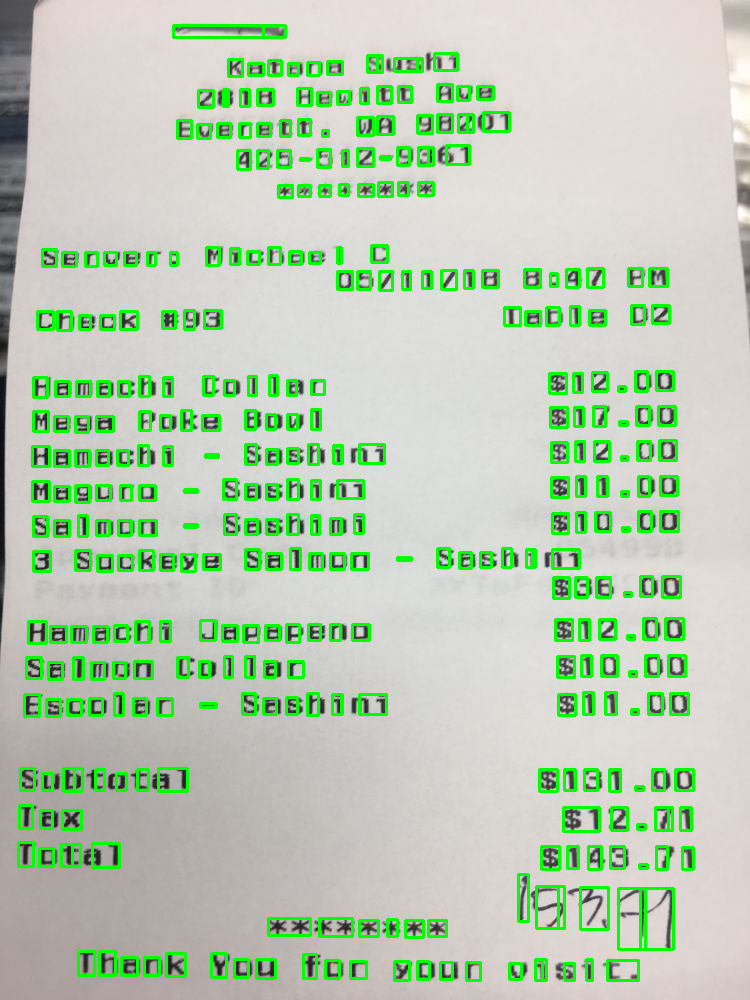

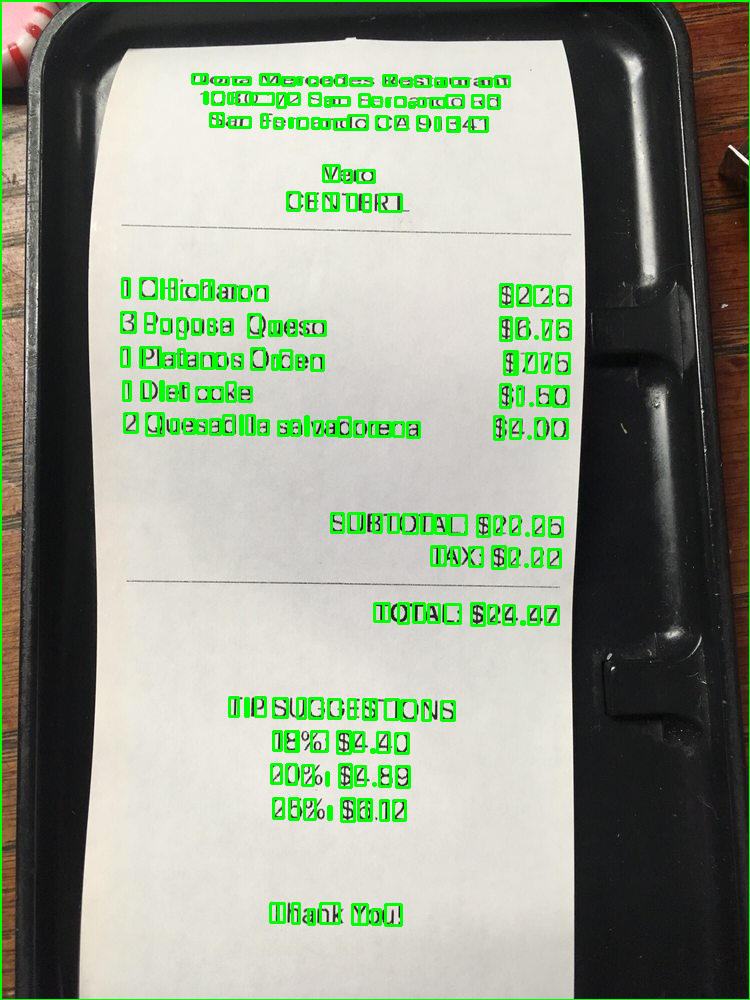

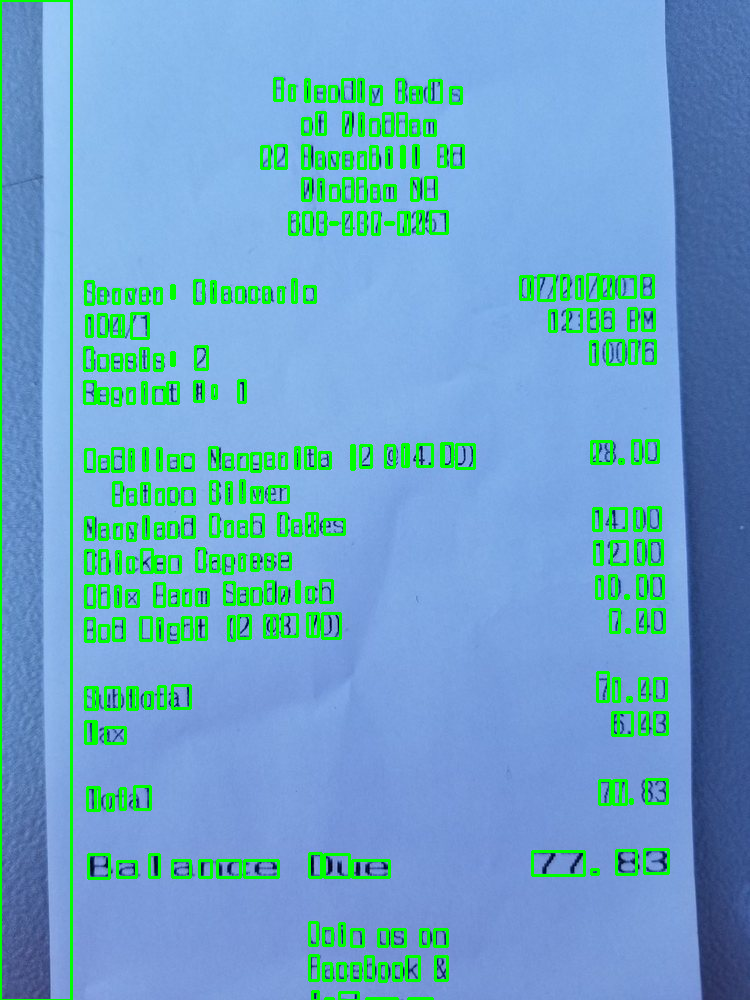

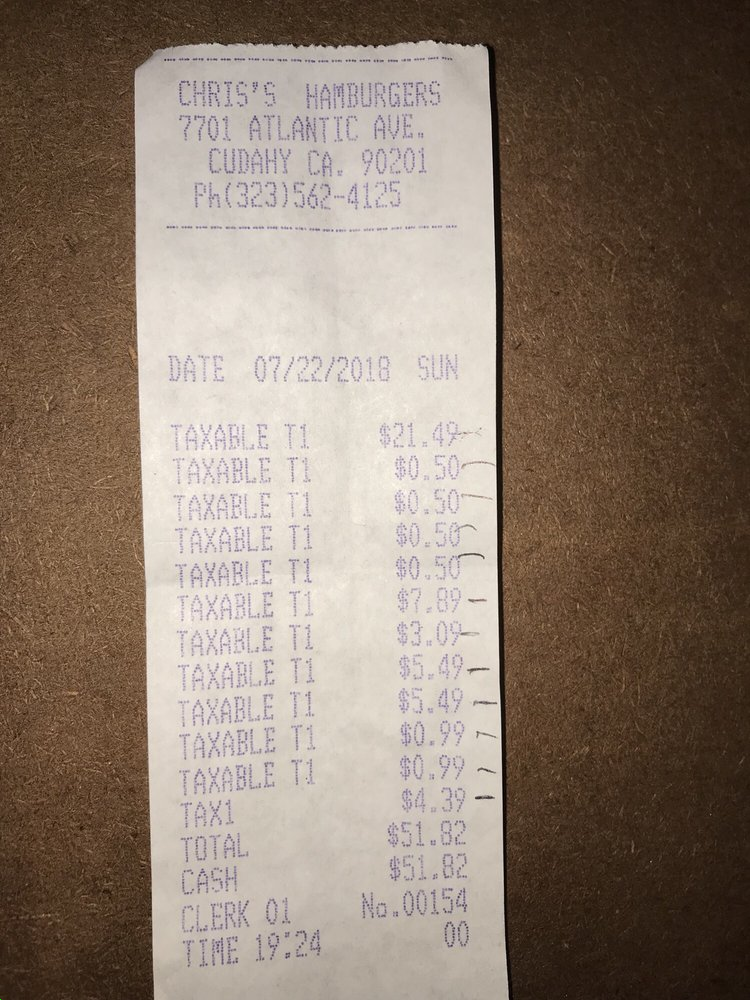

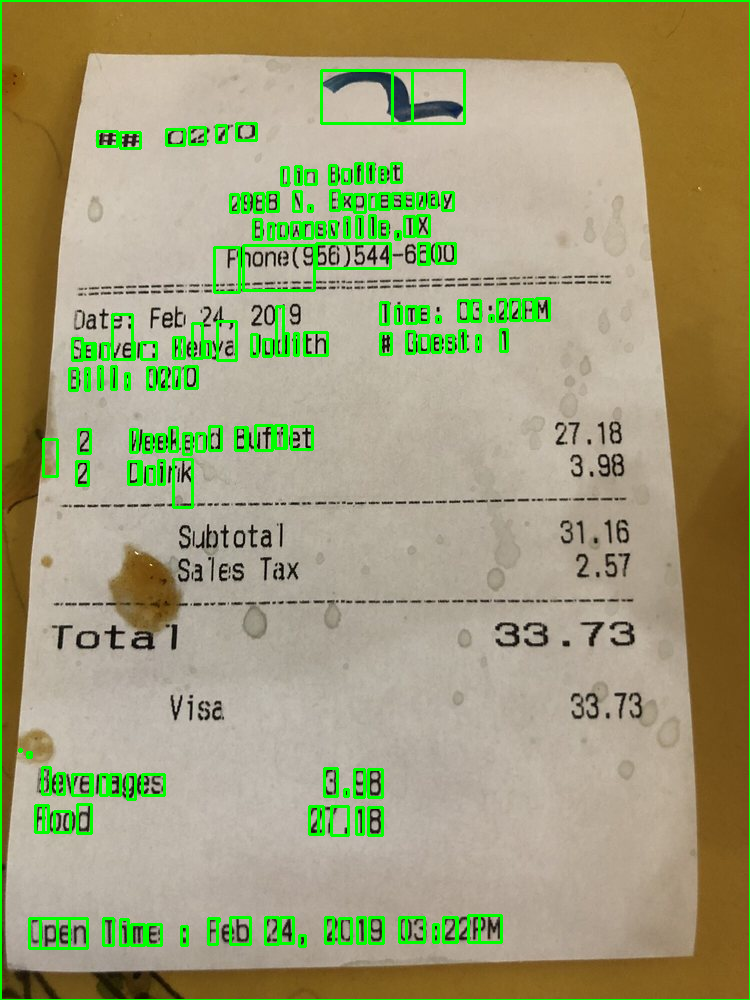

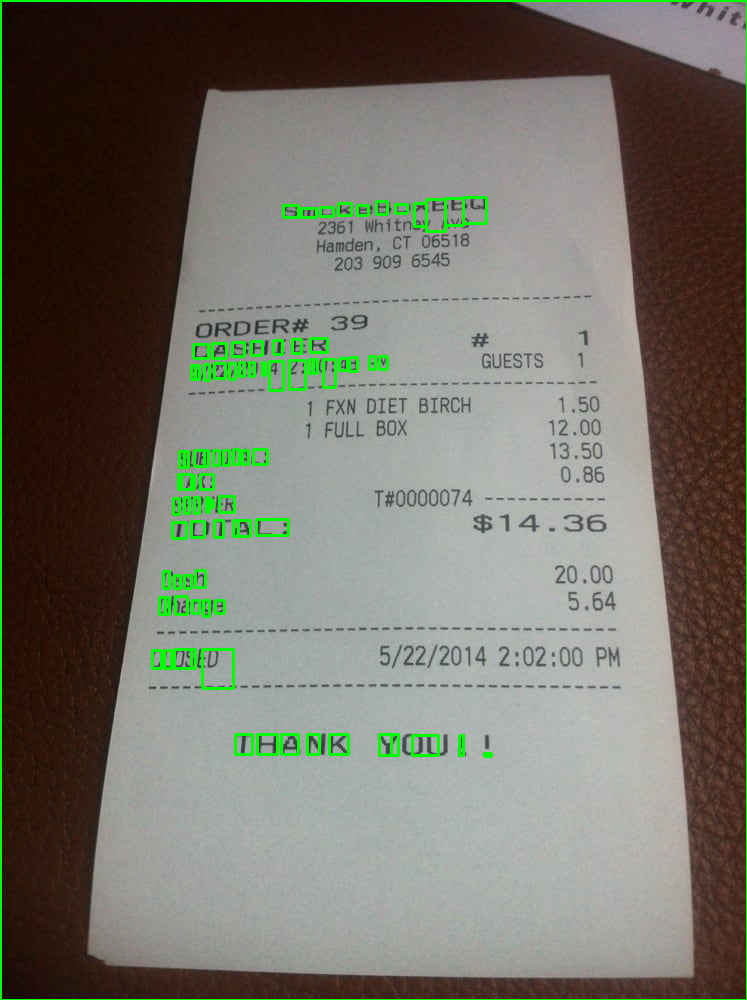

In [ ]:
import cv2
import pytesseract
from google.colab.patches import cv2_imshow

files = ["1007-receipt.jpg", "1008-receipt.jpg", "1010-receipt.jpg", "1026-receipt.jpg", "1074-receipt.jpg", "1075-receipt.jpg"]
for f in files:
  img = cv2.imread(f)

  h, w, c = img.shape
  boxes = pytesseract.image_to_boxes(img) 
  for b in boxes.splitlines():
      b = b.split(' ')
      img = cv2.rectangle(img, (int(b[1]), h - int(b[2])), (int(b[3]), h - int(b[4])), (0, 255, 0), 2)

  cv2_imshow(img)
  # cv2.imshow('img', img)
  # cv2.waitKey(0)

---

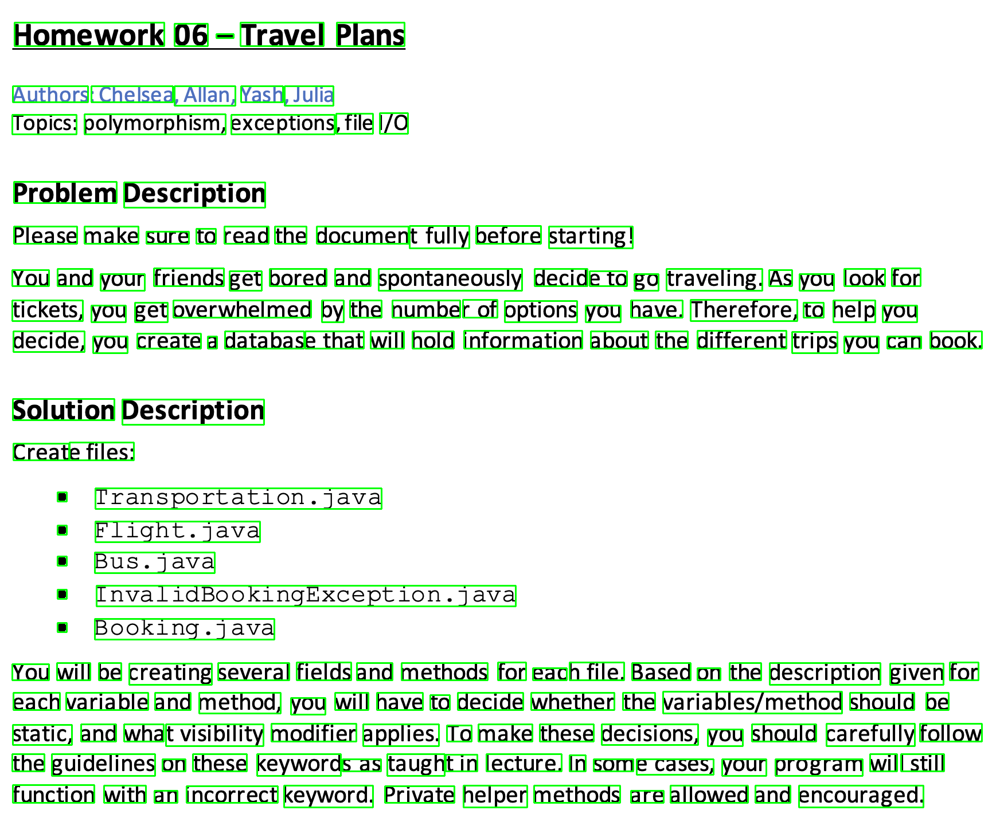

In [ ]:
from pytesseract import Output

img = cv2.imread("testing.png")

h, w, c = img.shape
d = pytesseract.image_to_data(img, output_type=Output.DICT)
n_boxes = len(d['text'])
for i in range(n_boxes):
    if int(d['conf'][i]) > 60:
        (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
        img = cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

cv2_imshow(img)

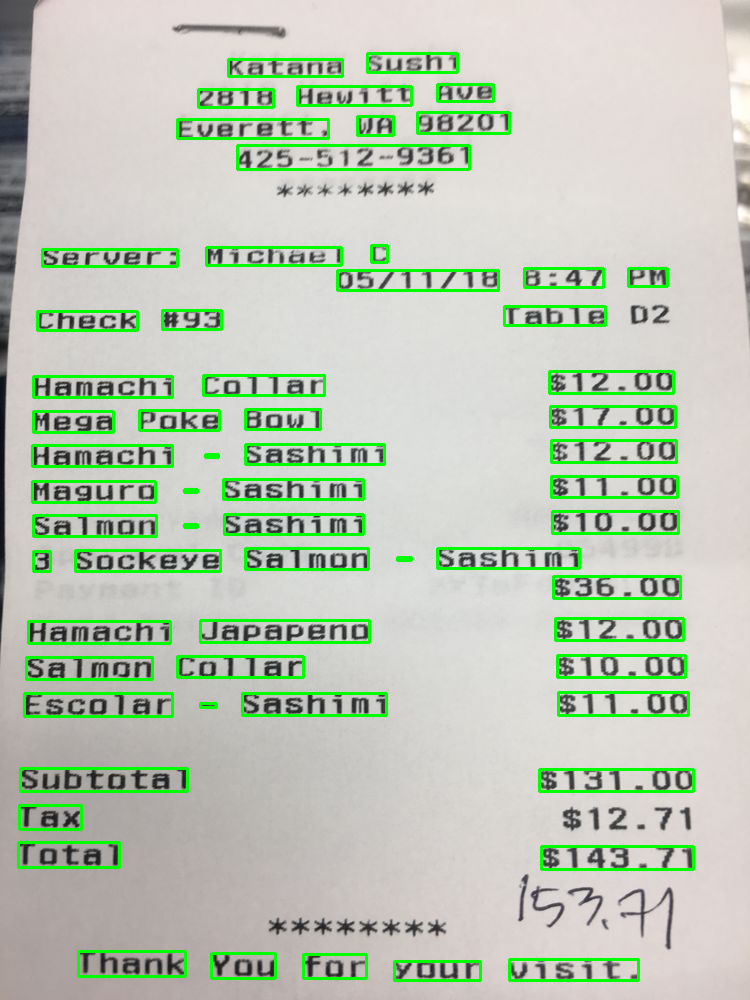

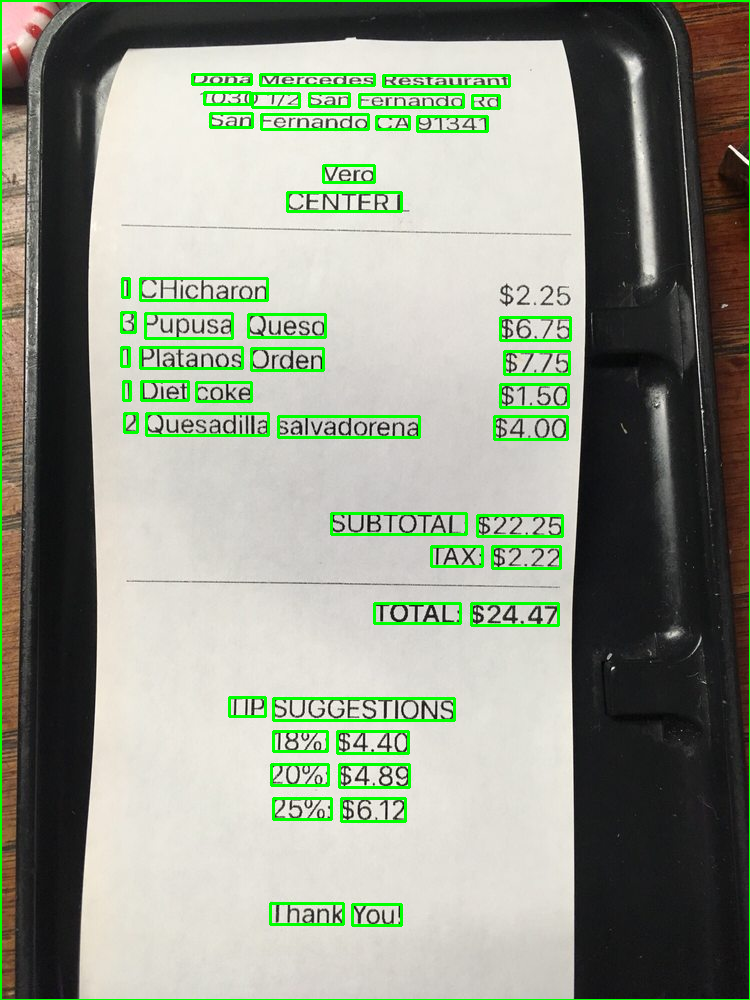

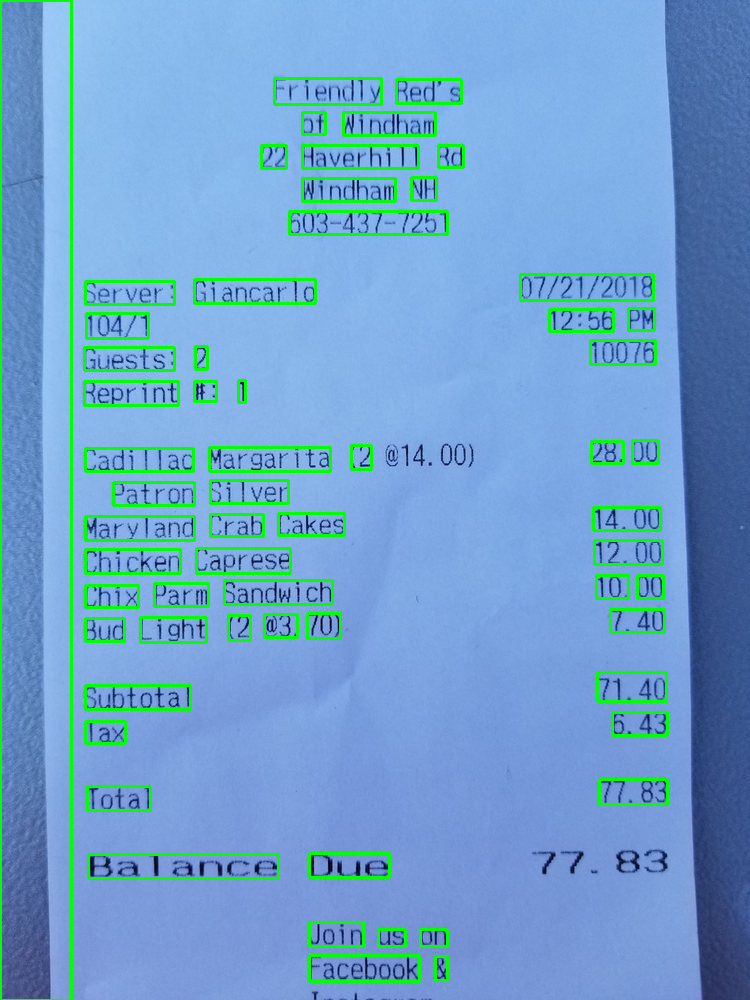

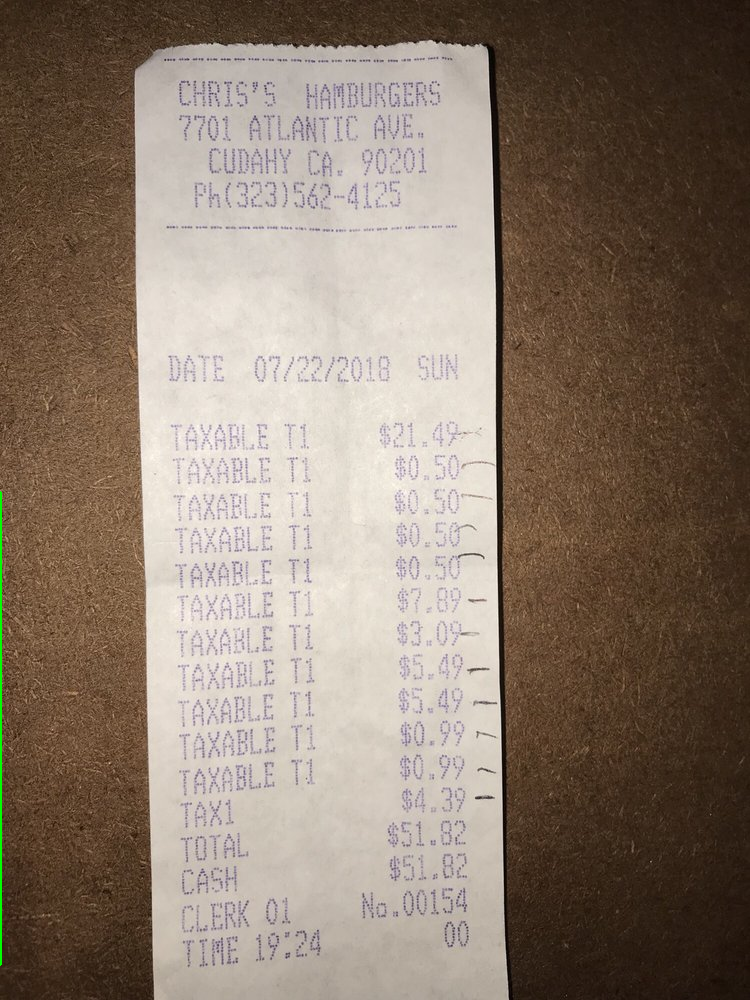

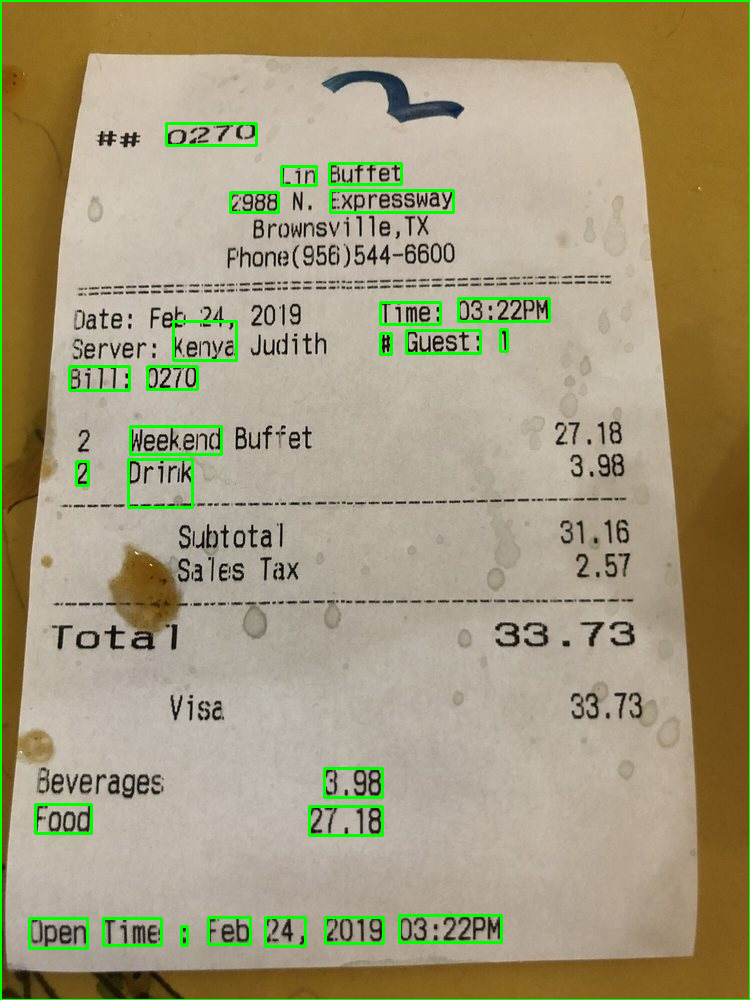

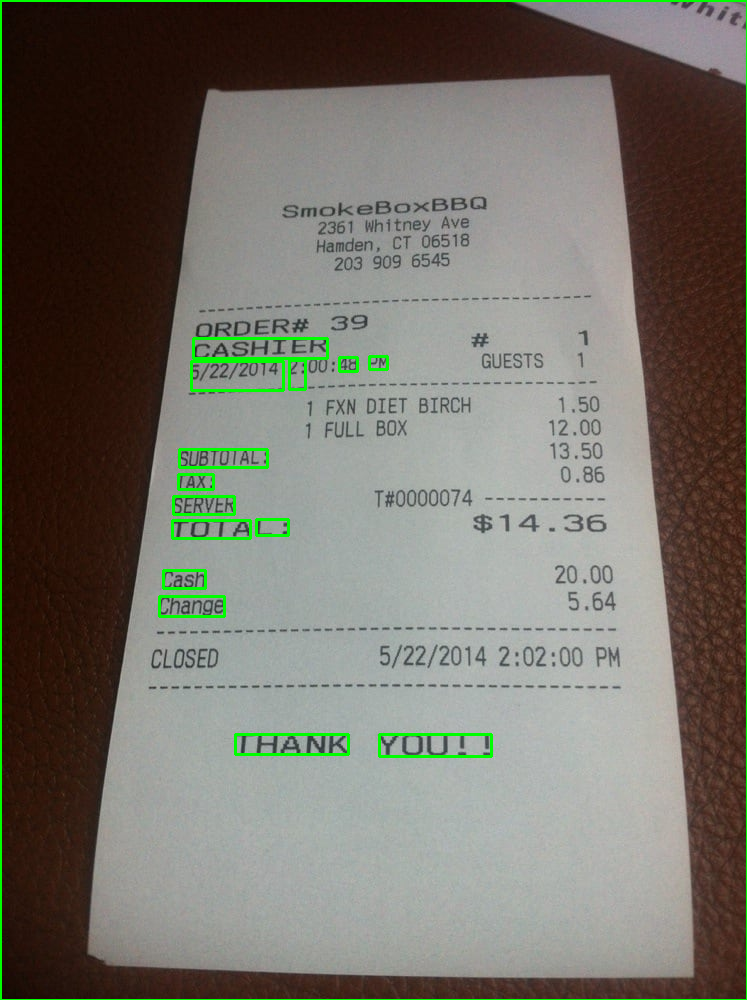

In [ ]:
for f in files:
  img = cv2.imread(f)

  h, w, c = img.shape
  d = pytesseract.image_to_data(img, output_type=Output.DICT)
  n_boxes = len(d['text'])
  for i in range(n_boxes):
      if int(d['conf'][i]) > 60:
          (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
          img = cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

  cv2_imshow(img)

In [42]:
import numpy as np
from PIL import Image

def deskew(image):
    coords = np.column_stack(np.where(image > 0))
    angle = cv2.minAreaRect(coords)[-1]
    if angle < -45:
        angle = -(90 + angle)
    else:
        angle = -angle
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return rotated

for f in files:
  img = cv2.imread(f)
  img = deskew(img)
  # img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  # img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
  print(img.shape)

  # h, w, c = img.shape
  # d = pytesseract.image_to_data(img, output_type=Output.DICT)
  # n_boxes = len(d['text'])
  # for i in range(n_boxes):
  #     if int(d['conf'][i]) > 60:
  #         (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
  #         img = cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

  # cv2_imshow(img)

error: ignored